# <span style="color:green"><center>**Diplomado en Inteligencia Artificial y Aprendizaje Profundo**</center></span>


## <span style="color:red"><center>Proyecto final del diplomado</center></span>

## <span style="color:red"><center>DETECCIÓN Y LOCALIZACIÓN DE TUMORES CEREBRALES MEDIANTE RECONOCIMIENTO DE IMAGENES DE RESONANCIA MAGNETICA</center></span>

* <span style="color:red"><center>Por Juan David Marín</center></span>
* <span style="color:red"><center>qcojuandavidmarin@gmail.com</center></span>

Este es un proyecto enfocado específicamente al sector de la salud, al sector de la sanidad y de la medicina. Específicamente se trata de analizar todas las imágenes de una resonancia magnética del cerebro.


[fuente de los datos](https://www.kaggle.com/mateuszbuda/lgg-mri-segmentation)

## Importar librerias 

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt 
import zipfile
import cv2
from skimage import io  # procesamiento de imágenes 
import tensorflow as tf 
from tensorflow.keras import Sequential
from tensorflow.keras import layers, optimizers
from tensorflow.keras.applications import DenseNet121 ## Densenet121
from tensorflow.keras.applications.resnet50 import ResNet50 ## ResNet50, red neuronal residual
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.utils import plot_model
from tensorflow.keras.initializers import glorot_uniform #Extraer muestras de una distribución uniforme
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler 
from IPython.display import display
from tensorflow.keras import backend as K  
from sklearn.preprocessing import StandardScaler, normalize
import os
import glob # buscador todos los nombres de ruta que coinciden con un patrón especificado
import random
from google.colab import files #Librería para cargar ficheros directamente en Colab
%matplotlib inline



In [4]:
# montar disco usando los siguientes comandos:

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
# Navegar hasta el directorio My Drive para cambiar el directorio de trabajo
%cd /content/drive/MyDrive/Proyecto final Diplomado IAAP /Healthcare AI Datasets/Brain_MRI

/content/drive/.shortcut-targets-by-id/1OShySL557_0nwSYbP9jwv6JrtkAUC4nM/Proyecto final Diplomado IAAP /Healthcare AI Datasets/Brain_MRI


In [23]:
# Datos que contienen la ruta a Brain MRI y su máscara correspondient donde uno indica si tiene cancer y cero que no
brain_df = pd.read_csv('data_mask.csv')
brain_df.head()


,patient_id,image_path,mask_path,mask
0,TCGA_CS_5395_19981004,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...,0
1,TCGA_CS_5395_19981004,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...,0
2,TCGA_CS_5395_19981004,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...,0
3,TCGA_CS_5395_19981004,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...,0
4,TCGA_CS_5395_19981004,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...,0


# Características del DF

In [24]:
# Ruta a la imagen de la resonancia magnética para el primer paciente
brain_df.mask_path[0] 

'TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_mask.tif'

In [25]:
# Ruta máscara de segmentación para el primer paciente
brain_df.image_path[0] 

'TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif'

In [27]:
# Contar cuantos casos son 1 y cuantos son 0
x1 = brain_df['mask'].value_counts()[0]
x2 = brain_df['mask'].value_counts()[1]
print('El dataset presenta',x1, 'imágenes sin tumor')
print('El dataset presenta', x2,'imágenes con tumor')

El dataset presenta 2556 imágenes sin tumor
El dataset presenta 1373 imágenes con tumor


In [10]:
y1 = brain_df['mask'].value_counts().index[0]
y2 = brain_df['mask'].value_counts().index[1]
print(y1)
print(y2)

0
1


In [11]:
# diagrama de barras de las categorias
import plotly.graph_objects as go

fig = go.Figure([go.Bar(x = brain_df['mask'].value_counts().index, y = brain_df['mask'].value_counts(), name='MASK')])
fig.update_traces(marker_color = 'rgb(250,0,0)', marker_line_color = 'rgb(150,0,0)',marker_line_width = 8, opacity = 0.5)
fig.update_layout(barmode='group')
fig.update_yaxes(title_text="mask")
fig.show()


In [ ]:
brain_df.mask_path

0       TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...
1       TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...
2       TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...
3       TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...
4       TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...
                              ...                        
3924    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...
3925    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...
3926    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...
3927    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...
3928    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_88...
Name: mask_path, Length: 3929, dtype: object

In [ ]:
brain_df.image_path

0       TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif
1       TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif
2       TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif
3       TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif
4       TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif
                              ...                        
3924    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...
3925    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...
3926    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...
3927    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...
3928    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_88...
Name: image_path, Length: 3929, dtype: object

## Mostrar una imagen con su máscara

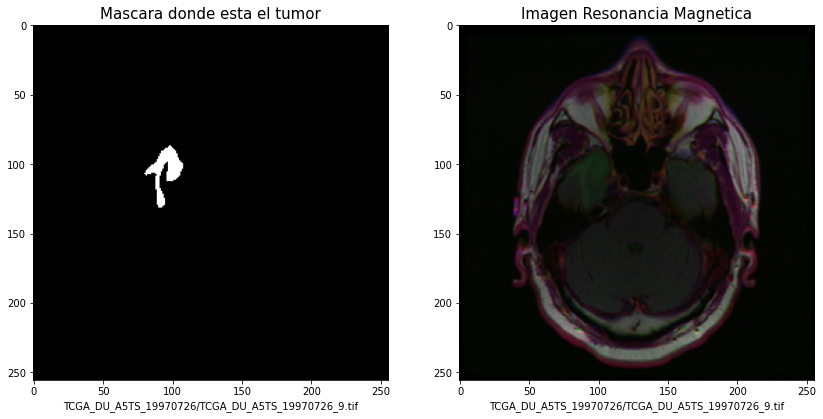

In [ ]:
plt.figure(figsize = (14,7))
plt.subplot(121)
plt.imshow(cv2.imread(brain_df.mask_path[923]))
plt.title('Mascara donde esta el tumor', fontsize = 15)
plt.xlabel(brain_df.image_path[923])

plt.subplot(122)
plt.imshow(cv2.imread(brain_df.image_path[923]))
plt.title('Imagen Resonancia Magnetica', fontsize = 15)
plt.xlabel(brain_df.image_path[923])
plt.show()

In [ ]:
print('La dimención maxima de la imagen de la mascara es', cv2.imread(brain_df.mask_path[923]).max())
print('La dimención minima de la imagen de la mascara es', cv2.imread(brain_df.mask_path[923]).min())
print('\n')
print('La dimención maxima de la imagen de resonancia magnetica es', cv2.imread(brain_df.image_path[923]).max())
print('La dimención minima de la imagen de resonancia magnetica es', cv2.imread(brain_df.image_path[923]).min())

La dimención maxima de la imagen de la mascara es 255
La dimención minima de la imagen de la mascara es 0


La dimención maxima de la imagen de resonancia magnetica es 210
La dimención minima de la imagen de resonancia magnetica es 0


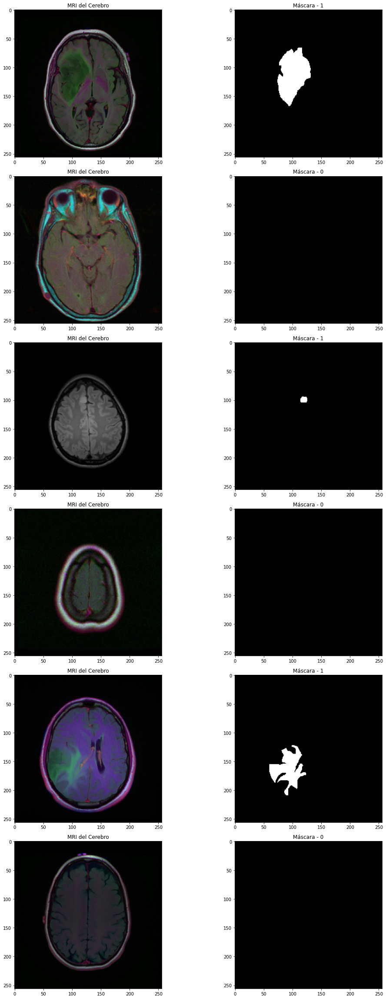

In [ ]:
# Visualizar imágenes (MRI y Máscaras) en el dataset de forma separada
import random
fig, axs = plt.subplots(6,2, figsize=(16,32))
count = 0
for x in range(6):
  i = random.randint(0, len(brain_df)) # Seleccionamos un índice aleatorio
  axs[count][0].title.set_text("MRI del Cerebro") # Configuramos el título
  axs[count][0].imshow(cv2.imread(brain_df.image_path[i])) # Mostramos la MRI 
  axs[count][1].title.set_text("Máscara - " + str(brain_df['mask'][i])) # Colocámos el título en la máscara (0 o 1)
  axs[count][1].imshow(cv2.imread(brain_df.mask_path[i])) # Mostramos la máscara correspondiente 
  count += 1

fig.tight_layout()

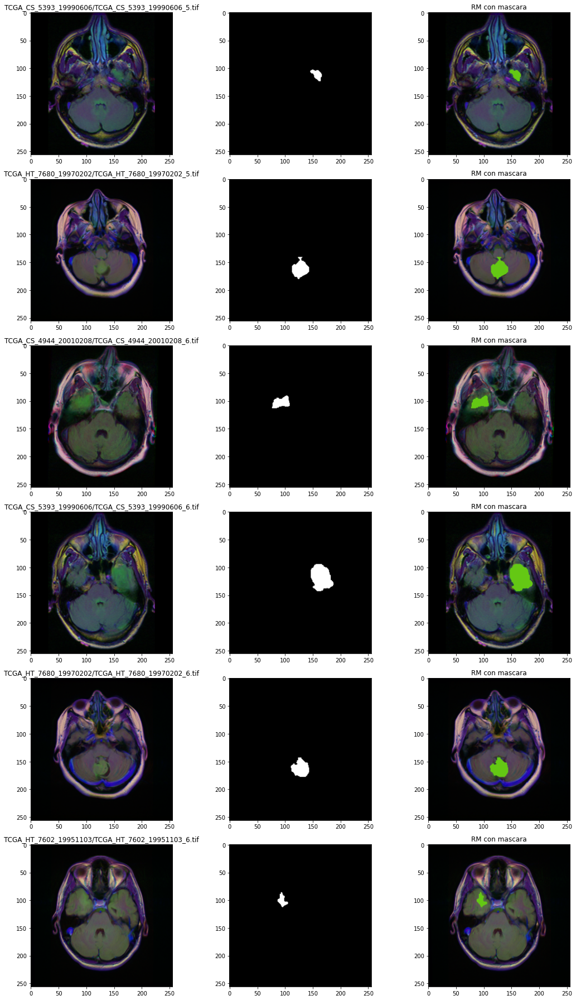

In [21]:
fig, ax = plt.subplots(6, 3, figsize = (15, 25))
count = 0
for i in range(len(brain_df)):
  if brain_df['mask'][i] == 1 and count <6:

    img = io.imread(brain_df.image_path[i])
    ax[count][0].title.set_text(brain_df.image_path[i])
    ax[count][0].imshow(img)
    mascara = io.imread(brain_df.mask_path[i])
    #ax[count][1].title.set_text(brain_df.mask_path[i])
    ax[count][1].imshow(mascara,cmap  = 'gray')
  
    img[mascara == 255] = (100, 200, 20)
    ax[count][2].title.set_text('RM con mascara')
    ax[count][2].imshow(img)
    count += 1

fig.tight_layout() # Ajustar en ancho y alto de la zona de dibujo

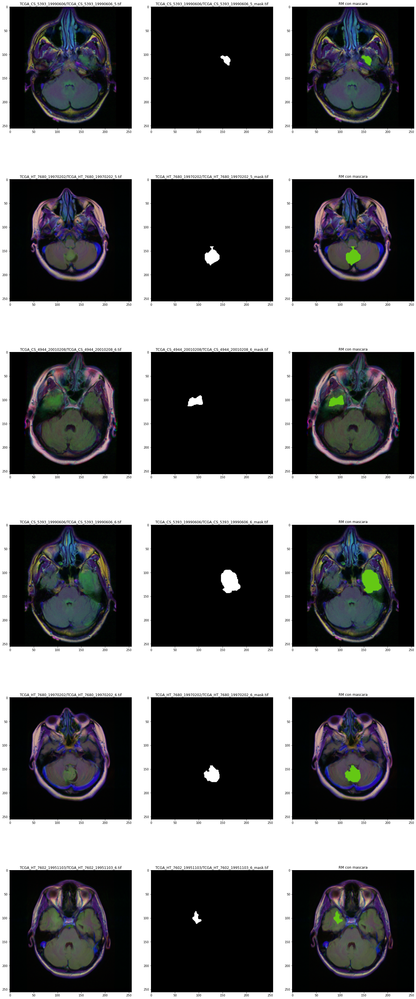

In [ ]:
fig, ax = plt.subplots(6, 3, figsize = (20, 50))
count = 0
for i in range(len(brain_df)):
  if brain_df['mask'][i] == 1 and count <6:

    img = io.imread(brain_df.image_path[i])
    ax[count][0].title.set_text(brain_df.image_path[i])
    ax[count][0].imshow(img)
    mascara = io.imread(brain_df.mask_path[i])
    ax[count][1].title.set_text(brain_df.mask_path[i])
    ax[count][1].imshow(mascara,cmap  = 'gray')
  
    img[mascara == 255] = (100, 200, 20)
    ax[count][2].title.set_text('RM con mascara')
    ax[count][2].imshow(img)
    count += 1

fig.tight_layout() # Ajustar en ancho y alto de la zona de dibujo

# MODELO CLASIFICADOR PARA DETECTAR SI EXISTE TUMOR O NO

In [78]:
# Eliminamos la columna de identificador del paciente porque no aporta a la construcción del modelo

brain_df_train = brain_df.drop(columns = ['patient_id'])

print('Tamaño datos originales', brain_df.shape)
print('Tamaño del nuevo conjunto de datos',brain_df_train.shape)

Tamaño datos originales (3929, 4)
Tamaño del nuevo conjunto de datos (3929, 3)


In [79]:
# Convertir los datos en la columna de máscara a formato de string, porque para ingresar tensorflow en flow_from_dataframe los datos deben ser en strings 

brain_df_train['mask'] = brain_df_train['mask'].apply(lambda x: str(x))
#brain_df_train['mask'] = str(brain_df_train['mask'])
print(brain_df.info(), '\n')
print(brain_df_train.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   patient_id  3929 non-null   object
 1   image_path  3929 non-null   object
 2   mask_path   3929 non-null   object
 3   mask        3929 non-null   int64 
dtypes: int64(1), object(3)
memory usage: 122.9+ KB
None 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  3929 non-null   object
 1   mask_path   3929 non-null   object
 2   mask        3929 non-null   object
dtypes: object(3)
memory usage: 92.2+ KB
None


# Entubamiento de datos

# Dividir los datos en entrenamiento y testing

In [80]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(brain_df_train, test_size = 0.15)

In [81]:
brain_df_train['mask'].value_counts().index


Index(['0', '1'], dtype='object')

In [82]:
# Cargar LIBRERIA PARA ingresar imagenes por batches

from tensorflow.keras.preprocessing.image import ImageDataGenerator # Preprocesar las imagenes que van a estrar al algoritmo 

In [83]:
# Generador de datos para entubamiento
datagen = ImageDataGenerator(rescale=1/255.,validation_split = 0.15) # Validation_split para que la Red no memorize 


In [84]:
# Dimensión de las imágenes para saber cómo deben entrar
cv2.imread(brain_df.mask_path[923]).shape

(256, 256, 3)

# Generando data de entrenamiento 

In [85]:
train_generator = datagen.flow_from_dataframe(
    dataframe = train,
    directory  = './', # Directorio donde nos encontramos 
    x_col = 'image_path', # Posición de las imágenes RM
    y_col = 'mask', # Lo que se quiere predecir 
    subset= 'training',
    batch_size = 16,
    shuffe = True,
    class_mode = 'categorical',
    target_size = (256,256))

Found 2839 validated image filenames belonging to 2 classes.


# Generando data de validación 

In [86]:
valid_generator = datagen.flow_from_dataframe(
    dataframe = train,
    directory = './',
    x_col = 'image_path',
    y_col = 'mask',
    subset = 'validation', # correspondiente al 15% (validation split)
    batch_size = 16,
    shuffle = True,
    class_mode = 'categorical',
    target_size = (256,256))

Found 500 validated image filenames belonging to 2 classes.


# Imágenes de prueba 

In [87]:
test_datagen = ImageDataGenerator(rescale=1/255.)

test_generator = test_datagen.flow_from_dataframe(
    dataframe = test,
    directory = './',
    x_col = 'image_path',
    y_col = 'mask',
    batch_size = 16,
    shuffle = False,
    class_mode = 'categorical',
    target_size = (256,256))

Found 590 validated image filenames belonging to 2 classes.


# Modelo simple (Modelo prueba 1)

# Modelo creado con la API funcional Sub Clase

In [ ]:
class MyModel(Model):
    def __init__(self):
        super(MyModel,self).__init__()
        self.conv1 = Conv2D(32, 3, strides=2, padding="same")
        self.nomalization1 = BatchNormalization()
        self.activation1 = Activation("relu")
        self.maxpooling1 = MaxPooling2D(3, strides=2, padding="same")
        self.dropout1 = Dropout(0.4)
        self.conv2 = Conv2D(64, 3, strides=2, padding="same")
        self.nomalization2 = BatchNormalization()
        self.activation2 = Activation("relu")
        self.global_average = GlobalAveragePooling2D()
        self.flatten= Flatten()
        self.d1 = Dense(128, activation='relu')
        self.d2 = Dense(2, activation='softmax')

    def call(self,x):
        x = self.conv1(x)
        x = self.nomalization1(x)
        x = self.activation1(x)
        x = self.maxpooling1(x)
        x = self.dropout1(x)
        x = self.conv2(x)
        x = self.nomalization2(x)
        x = self.activation2(x)
        x = self.global_average(x)
        x = self.flatten(x)
        x = self.d1(x)
        return self.d2(x)

# crea una instancia del modelo
model = MyModel()

# Compilar el modelo 1

In [ ]:
model.compile(loss = 'categorical_crossentropy', optimizer='adam', metrics= ["accuracy"])

In [ ]:
class MNIST_Callback(tf.keras.callbacks.Callback):
    
    # método dentro de la clase myCallback, heredada de la clase Callback de keras
    def on_epoch_end(self, epoch, logs={}):
        if(logs.get('val_accuracy')>0.985):
            print("\nSe alcanzó un 98.5% de precisión en la validación! Cancelando Entrenamiento...")
            self.model.stop_training = True

# crea una instancia de clase
accu_callback = MNIST_Callback()

# Entrenar el modelo 1

In [ ]:
history = model.fit(train_generator,
                              epochs=15,
                              verbose=1,
                              validation_data=valid_generator,
                              shuffle=True,
                              callbacks = [accu_callback])

Epoch 1/15
178/178 [==============================] - 12s 62ms/step - loss: 0.5823 - accuracy: 0.6729 - val_loss: 1.6338 - val_accuracy: 0.3460
Epoch 2/15
178/178 [==============================] - 11s 61ms/step - loss: 0.4948 - accuracy: 0.7457 - val_loss: 1.4743 - val_accuracy: 0.3460
Epoch 3/15
178/178 [==============================] - 10s 58ms/step - loss: 0.4749 - accuracy: 0.7524 - val_loss: 0.7676 - val_accuracy: 0.5000
Epoch 4/15
178/178 [==============================] - 10s 58ms/step - loss: 0.4653 - accuracy: 0.7653 - val_loss: 0.6880 - val_accuracy: 0.5900
Epoch 5/15
178/178 [==============================] - 10s 58ms/step - loss: 0.4615 - accuracy: 0.7717 - val_loss: 0.5254 - val_accuracy: 0.7020
Epoch 6/15
178/178 [==============================] - 10s 56ms/step - loss: 0.4665 - accuracy: 0.7471 - val_loss: 0.5898 - val_accuracy: 0.7060
Epoch 7/15
178/178 [==============================] - 10s 58ms/step - loss: 0.4526 - accuracy: 0.7493 - val_loss: 0.4882 - val_accuracy:

Model: "my_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              multiple                  896       
_________________________________________________________________
batch_normalization (BatchNo multiple                  128       
_________________________________________________________________
activation (Activation)      multiple                  0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) multiple                  0         
_________________________________________________________________
dropout (Dropout)            multiple                  0         
_________________________________________________________________
conv2d_1 (Conv2D)            multiple                  18496     
_________________________________________________________________
batch_normalization_1 (Batch multiple                  256

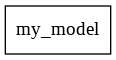

In [ ]:
model.summary()
plot_model(model,show_shapes=True)

In [ ]:
path = './model1'
if not os.path.exists(path):
    os.mkdir(path)
model.save('./model1/model1.tf')
model.save_weights('./model1/pesos_model1.tf')

INFO:tensorflow:Assets written to: ./model1/model1.tf/assets


# Graficos de perdida y accuracy para el primer modelo

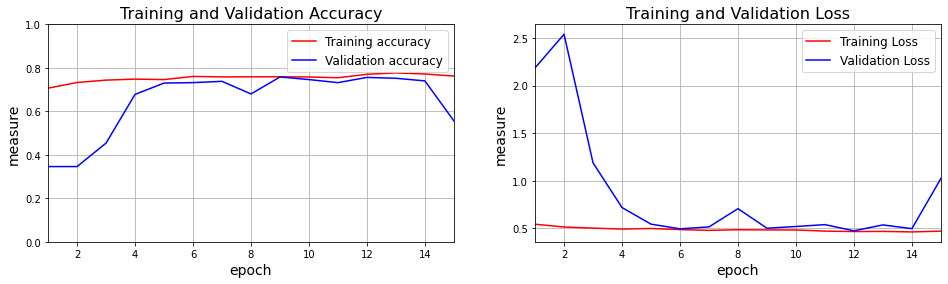

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1,len(acc)+1)

n_row = 1
n_col = 2
fig, ax = plt.subplots(n_row, n_col, sharex = False, sharey = False, figsize=(16,4))


ax[0].plot(epochs, acc, 'r-', label='Training accuracy')
ax[0].plot(epochs, val_acc, 'b-', label='Validation accuracy')
ax[0].legend(fontsize=12,loc=0)
ax[0].set_title('Training and Validation Accuracy',fontsize=16)
ax[0].set_ylabel('measure',fontsize=14)
ax[0].set_xlabel('epoch', fontsize = 14)
ax[0].set_ylim(0,1)
ax[0].grid()
ax[0].set_xlim([1, len(acc)])

ax[1].plot(epochs, loss, 'r-', label='Training Loss')
ax[1].plot(epochs, val_loss, 'b-', label='Validation Loss')
ax[1].legend(fontsize=12)
ax[1].set_title('Training and Validation Loss',fontsize=16)
ax[1].set_ylabel('measure',fontsize=14)
ax[1].set_xlabel('epoch', fontsize = 14)
ax[1].set_xlim([1, len(acc)])
ax[1].grid()

plt.show()

# Aumentando capas con modelo secuencial y activación sigmoide (Modelo prueba 2)

In [16]:

model_sec = tf.keras.models.Sequential([
                                    Conv2D(32, 3,activation='relu',  input_shape= (256, 256, 3)),
                                    BatchNormalization(),
                                    Activation("relu"),
                                    MaxPooling2D(3,strides=2, padding='same'),
                                    Dropout(0.4),
                                    Conv2D(64,3,strides=2,padding='same'),
                                    BatchNormalization(),
                                    Activation('relu'),
                                    Flatten(),
                                    Dense(256, activation='relu'),
                                    Dense(128, activation='relu'),
                                    Dense(2, activation='sigmoid')
                                                         
])

In [17]:
# Compilar 
model_sec.compile(loss = 'categorical_crossentropy', optimizer='adam', metrics= ["accuracy"])


In [18]:

# Callbacks
# reduce learning rate by sqrt(0.1) if the loss does not improve in 5 epochs
lr_reducer = ReduceLROnPlateau(factor=np.sqrt(0.1),
                               cooldown=0,
                               patience=5,
                               verbose=1,
                               min_lr=0.5e-6)

# save weights for future use (e.g. reload parameters w/o training)
checkpoint = ModelCheckpoint(filepath='./model_sec',
                             monitor='val_loss',
                             verbose=1,
                             save_best_only=True)


# called every epoch
callbacks = [lr_reducer, checkpoint]


In [19]:
history_model_sec = model_sec.fit(train_generator,
                              epochs=20,
                              verbose=1,
                              validation_data=valid_generator,
                              shuffle=True,
                              callbacks = [callbacks])

Epoch 1/20
178/178 [==============================] - 1255s 7s/step - loss: 12.8520 - accuracy: 0.6356 - val_loss: 1.0855 - val_accuracy: 0.6420

Epoch 00001: val_loss improved from inf to 1.08553, saving model to ./model_sec
INFO:tensorflow:Assets written to: ./model_sec/assets
Epoch 2/20
178/178 [==============================] - 12s 66ms/step - loss: 0.8600 - accuracy: 0.7983 - val_loss: 1.2165 - val_accuracy: 0.6440

Epoch 00002: val_loss did not improve from 1.08553
Epoch 3/20
178/178 [==============================] - 12s 67ms/step - loss: 0.2946 - accuracy: 0.8958 - val_loss: 0.4101 - val_accuracy: 0.8120

Epoch 00003: val_loss improved from 1.08553 to 0.41012, saving model to ./model_sec
INFO:tensorflow:Assets written to: ./model_sec/assets
Epoch 4/20
178/178 [==============================] - 13s 75ms/step - loss: 0.3065 - accuracy: 0.8880 - val_loss: 0.4842 - val_accuracy: 0.8160

Epoch 00004: val_loss did not improve from 0.41012
Epoch 5/20
178/178 [=========================

In [20]:
path = './model_sec'
if not os.path.exists(path):
    os.mkdir(path)
model_sec.save('./model_sec/model_sec.h5')
model_sec.save_weights('./model_sec/pesos_model_sec.h5')

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_12 (Conv2D)           (None, 254, 254, 32)      896       
_________________________________________________________________
batch_normalization_9 (Batch (None, 254, 254, 32)      128       
_________________________________________________________________
activation_9 (Activation)    (None, 254, 254, 32)      0         
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 127, 127, 32)      0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 127, 127, 32)      0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 64, 64, 64)        18496     
_________________________________________________________________
batch_normalization_10 (Batc (None, 64, 64, 64)       

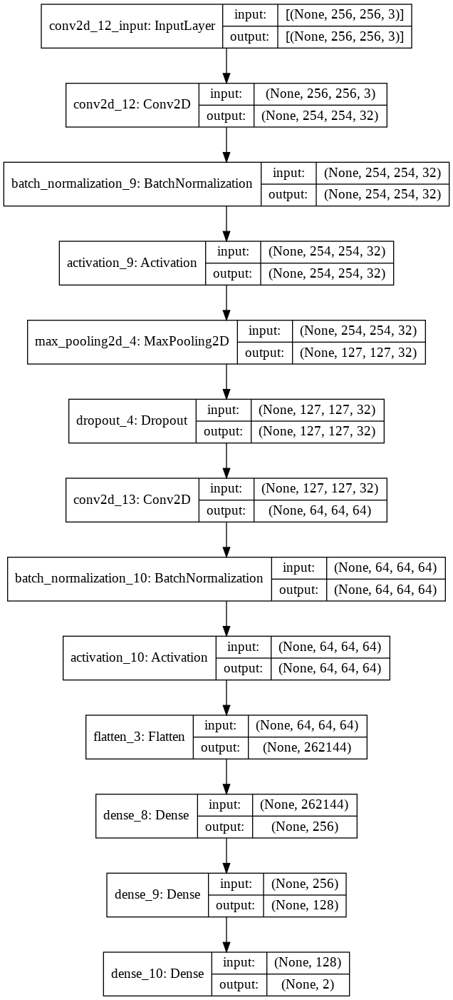

In [ ]:
model_sec.summary()
plot_model(model_sec,show_shapes=True)

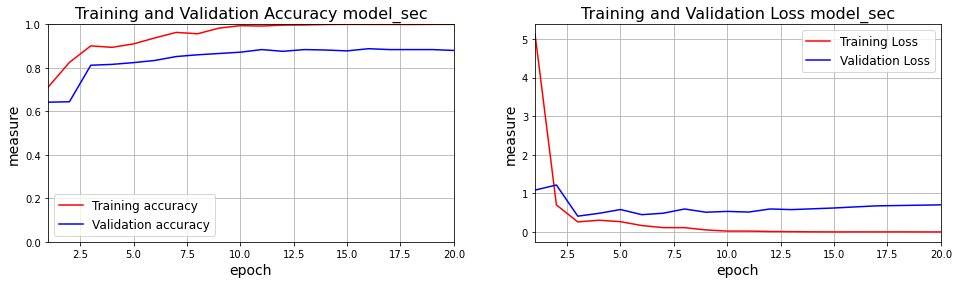

In [21]:
acc = history_model_sec.history['accuracy']
val_acc = history_model_sec.history['val_accuracy']
loss = history_model_sec.history['loss']
val_loss = history_model_sec.history['val_loss']

epochs = range(1,len(acc)+1)

n_row = 1
n_col = 2
fig, ax = plt.subplots(n_row, n_col, sharex = False, sharey = False, figsize=(16,4))


ax[0].plot(epochs, acc, 'r-', label='Training accuracy')
ax[0].plot(epochs, val_acc, 'b-', label='Validation accuracy')
ax[0].legend(fontsize=12,loc=0)
ax[0].set_title('Training and Validation Accuracy model_sec',fontsize=16)
ax[0].set_ylabel('measure',fontsize=14)
ax[0].set_xlabel('epoch', fontsize = 14)
ax[0].set_ylim(0,1)
ax[0].grid()
ax[0].set_xlim([1, len(acc)])

ax[1].plot(epochs, loss, 'r-', label='Training Loss')
ax[1].plot(epochs, val_loss, 'b-', label='Validation Loss')
ax[1].legend(fontsize=12)
ax[1].set_title('Training and Validation Loss model_sec',fontsize=16)
ax[1].set_ylabel('measure',fontsize=14)
ax[1].set_xlabel('epoch', fontsize = 14)
ax[1].set_xlim([1, len(acc)])
ax[1].grid()

plt.show()


#<span style="color:red"><center>**Modelo base ResNet50**</center></span>

In [22]:
# Se ajusta a falso el parámetro de include_top, ya que no es necesario, más adelante se acoplará la salida de dos categorías que se refieren a detectado o no detectado
# Se usaran los pesos ya entrenados de Imagenet
# input_tensor especifica el tamaño del tensor 
basemodel = ResNet50(weights='imagenet', include_top=False, input_tensor=Input(shape=(256,256,3)))


94773248/94765736 [==============================] - 1s 0us/step


# Resumen del modelo base

Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 262, 262, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 128, 128, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 128, 128, 64) 256         conv1_conv[0][0]                 
___________________________________________________________________________________________

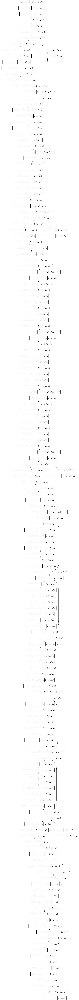

In [16]:
basemodel.summary()
plot_model(basemodel,show_shapes=True)

In [67]:
# Congelar los pesos del modelo para que no se entrene mas ninguna de las capas
for layer in basemodel.layers:
  layers.trainable = False

# Agregar al final la clasificación binaria al modelo base personalizada, esta parte del modelo se entrenara (Modelo prueba 3)

In [27]:

headmodel = basemodel.output # Ingresa la salida del modelo base
headmodel = AveragePooling2D(pool_size=(4,4))(headmodel) # reducir a 2x2
headmodel = Flatten(name='Flatten')(headmodel) # Aplanar

headmodel = Dense(256, activation='relu')(headmodel)
headmodel = Dropout(0.3)(headmodel)

headmodel = Dense(256, activation='relu')(headmodel)
headmodel = Dropout(0.3)(headmodel)


headmodel = Dense(2, activation='sigmoid')(headmodel) 

modelResnet50 = Model(inputs = basemodel.input, outputs = headmodel)

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 262, 262, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 128, 128, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 128, 128, 64) 256         conv1_conv[0][0]                 
____________________________________________________________________________________________

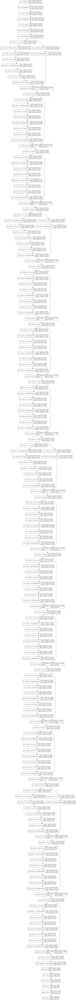

In [21]:
modelResnet50.summary()
plot_model(modelResnet50,show_shapes=True)

# Compilar el modelo

In [28]:
modelResnet50.compile(loss = 'binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Callbacks

In [43]:
# Interrumpir el entrenamiento si no mejora la validación de perdida 
earlystopping = EarlyStopping(monitor='accuracy', 
                              mode='min', verbose=1,
                              patience=20) # Cuando el minimo lleve 20 iteracciones sin mejorar se corte

# Guardar el mejor modelo
checkpointer = ModelCheckpoint(filepath="model-resnet-weights.hdf5", 
                               verbose=1, save_best_only=True)
# called every epoch
callbacks = [earlystopping, checkpointer]




# Entrenar el modelo

In [30]:
train_generator.n//16

177

In [31]:
steps_per_epoch = train_generator.n // 16 # Dividido en 16 por que son la cantidad de imagenes que se van ingresando
print(steps_per_epoch)


177


In [44]:

historyResNet = modelResnet50.fit(train_generator,
                    validation_data = valid_generator,
                    steps_per_epoch= steps_per_epoch, 
                    epochs = 20,
                    validation_steps= steps_per_epoch, 
                    verbose = 1,
                    callbacks= callbacks)


Epoch 1/20
177/177 [==============================] - 43s 241ms/step - loss: 0.1085 - accuracy: 0.9695 - val_loss: 0.4056 - val_accuracy: 0.9180

Epoch 00001: val_loss improved from inf to 0.40563, saving model to model-resnet-weights.hdf5
Epoch 2/20
177/177 [==============================] - 43s 240ms/step - loss: 0.1098 - accuracy: 0.9646 - val_loss: 0.2648 - val_accuracy: 0.9280

Epoch 00002: val_loss improved from 0.40563 to 0.26481, saving model to model-resnet-weights.hdf5
Epoch 3/20
177/177 [==============================] - 43s 241ms/step - loss: 0.0491 - accuracy: 0.9858 - val_loss: 0.3266 - val_accuracy: 0.9320

Epoch 00003: val_loss did not improve from 0.26481
Epoch 4/20
177/177 [==============================] - 43s 240ms/step - loss: 0.0709 - accuracy: 0.9773 - val_loss: 0.3678 - val_accuracy: 0.9080

Epoch 00004: val_loss did not improve from 0.26481
Epoch 5/20
177/177 [==============================] - 43s 241ms/step - loss: 0.0467 - accuracy: 0.9837 - val_loss: 0.3350 

In [45]:
# Guardar el modelo resnet50
path = './modelResnet50'
if not os.path.exists(path):
    os.mkdir(path)
modelResnet50.save('./modelResnet50/modelResnet50.h5')
modelResnet50.save_weights('./modelResnet50/modelResnet50.h5')

## Perdida 


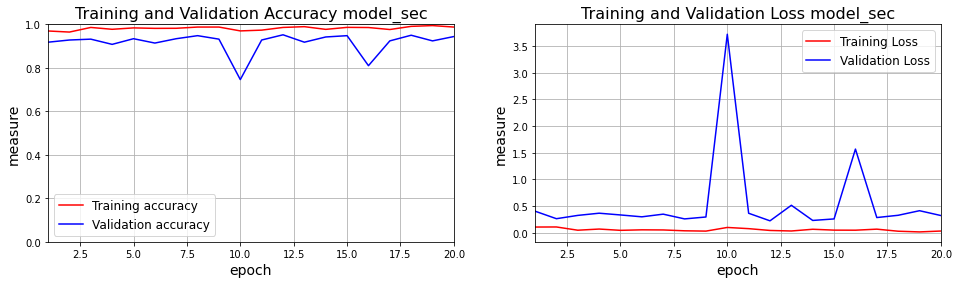

In [46]:
acc = historyResNet.history['accuracy']
val_acc = historyResNet.history['val_accuracy']
loss = historyResNet.history['loss']
val_loss = historyResNet.history['val_loss']

epochs = range(1,len(acc)+1)

n_row = 1
n_col = 2
fig, ax = plt.subplots(n_row, n_col, sharex = False, sharey = False, figsize=(16,4))


ax[0].plot(epochs, acc, 'r-', label='Training accuracy')
ax[0].plot(epochs, val_acc, 'b-', label='Validation accuracy')
ax[0].legend(fontsize=12,loc=0)
ax[0].set_title('Training and Validation Accuracy model_sec',fontsize=16)
ax[0].set_ylabel('measure',fontsize=14)
ax[0].set_xlabel('epoch', fontsize = 14)
ax[0].set_ylim(0,1)
ax[0].grid()
ax[0].set_xlim([1, len(acc)])

ax[1].plot(epochs, loss, 'r-', label='Training Loss')
ax[1].plot(epochs, val_loss, 'b-', label='Validation Loss')
ax[1].legend(fontsize=12)
ax[1].set_title('Training and Validation Loss model_sec',fontsize=16)
ax[1].set_ylabel('measure',fontsize=14)
ax[1].set_xlabel('epoch', fontsize = 14)
ax[1].set_xlim([1, len(acc)])
ax[1].grid()

plt.show()

# Modificando parametros al modelo Resnet (Modelo prueba 4)

In [93]:
# Interrumpir el entrenamiento si no mejora la validación de perdida 
earlystopping = EarlyStopping(monitor='loss', 
                              mode='min', verbose=1,
                              patience=20) # Cuando el minimo lleve 20 iteracciones sin mejorar se corte

# Guardar el mejor 
checkpointer = ModelCheckpoint(filepath="model-resnet-weights.hdf5", 
                               verbose=1, save_best_only=True)
# called every epoch
callbacks = [earlystopping, checkpointer]

In [89]:

# Agregar al final la clasificación binaria al modelo base personalizada, esta parte del modelo no se entrena 
headmodel = basemodel.output # Ingresa la salida del modelo base
headmodel = AveragePooling2D(pool_size=(4,4))(headmodel) # reducir a 2x2
headmodel = Flatten(name='Flatten')(headmodel) # Aplanar

headmodel = Dense(256, activation='relu')(headmodel)
headmodel = Dropout(0.3)(headmodel)

headmodel = Dense(256, activation='relu')(headmodel)
headmodel = Dropout(0.3)(headmodel)
headmodel = Dense(256, activation = "relu")(headmodel)
headmodel = Dropout(0.3)(headmodel)
headmodel = Dense(2, activation='sigmoid')(headmodel) 

modelResnet502 = Model(inputs = basemodel.input, outputs = headmodel)

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 262, 262, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 128, 128, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 128, 128, 64) 256         conv1_conv[0][0]                 
____________________________________________________________________________________________

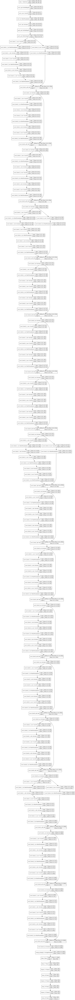

In [70]:
modelResnet502.summary()
plot_model(modelResnet50_2,show_shapes=True)

In [90]:
modelResnet502.compile(loss = 'binary_crossentropy', optimizer='adam', metrics=['accuracy'])

In [91]:
steps_per_epoch = train_generator.n // 16 # Dividido en 16 por que son la cantidad de imagenes que se van ingresando
print(steps_per_epoch)


177


In [94]:
historyResNet2= modelResnet502.fit(train_generator,
                    validation_data = valid_generator,
                    steps_per_epoch= steps_per_epoch, 
                    epochs = 20,
                    validation_steps= steps_per_epoch, 
                    verbose = 1,
                    callbacks = [callbacks])

Epoch 1/20
177/177 [==============================] - 41s 231ms/step - loss: 0.0625 - accuracy: 0.9844 - val_loss: 0.1119 - val_accuracy: 0.9780

Epoch 00001: val_loss improved from inf to 0.11190, saving model to model-resnet-weights.hdf5
Epoch 2/20
177/177 [==============================] - 42s 234ms/step - loss: 0.0527 - accuracy: 0.9841 - val_loss: 0.0686 - val_accuracy: 0.9780

Epoch 00002: val_loss improved from 0.11190 to 0.06862, saving model to model-resnet-weights.hdf5
Epoch 3/20
177/177 [==============================] - 42s 236ms/step - loss: 0.0304 - accuracy: 0.9919 - val_loss: 0.1330 - val_accuracy: 0.9560

Epoch 00003: val_loss did not improve from 0.06862
Epoch 4/20
177/177 [==============================] - 42s 237ms/step - loss: 0.0532 - accuracy: 0.9837 - val_loss: 0.0932 - val_accuracy: 0.9740

Epoch 00004: val_loss did not improve from 0.06862
Epoch 5/20
177/177 [==============================] - 42s 239ms/step - loss: 0.0316 - accuracy: 0.9936 - val_loss: 0.0780 

In [95]:
# Guardar el modelo modelResnet50_2
path = './modelResnet502'
if not os.path.exists(path):
    os.mkdir(path)
modelResnet502.save('./modelResnet502/modelResnet50.h5')
modelResnet502.save_weights('./modelResnet502/modelResnet50.h5')

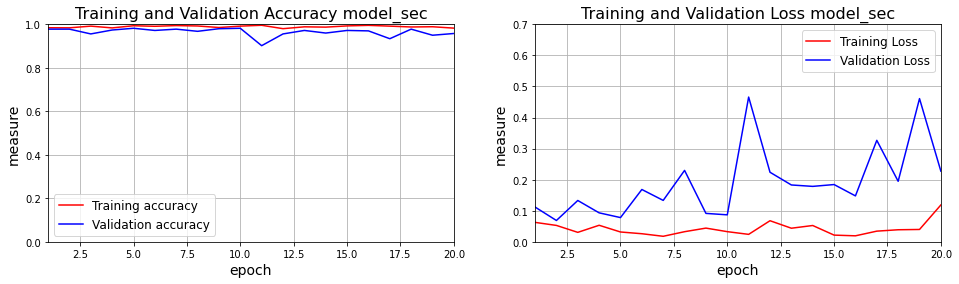

In [100]:
acc = historyResNet2.history['accuracy']
val_acc = historyResNet2.history['val_accuracy']
loss = historyResNet2.history['loss']
val_loss = historyResNet2.history['val_loss']

epochs = range(1,len(acc)+1)

n_row = 1
n_col = 2
fig, ax = plt.subplots(n_row, n_col, sharex = False, sharey = False, figsize=(16,4))


ax[0].plot(epochs, acc, 'r-', label='Training accuracy')
ax[0].plot(epochs, val_acc, 'b-', label='Validation accuracy')
ax[0].legend(fontsize=12,loc=0)
ax[0].set_title('Training and Validation Accuracy model_sec',fontsize=16)
ax[0].set_ylabel('measure',fontsize=14)
ax[0].set_xlabel('epoch', fontsize = 14)
ax[0].set_ylim(0,1)
ax[0].grid()
ax[0].set_xlim([1, len(acc)])

ax[1].plot(epochs, loss, 'r-', label='Training Loss')
ax[1].plot(epochs, val_loss, 'b-', label='Validation Loss')
ax[1].legend(fontsize=12)
ax[1].set_title('Training and Validation Loss model_sec',fontsize=16)
ax[1].set_ylabel('measure',fontsize=14)
ax[1].set_xlabel('epoch', fontsize = 14)
ax[1].set_ylim([0,0.7])
ax[1].set_xlim([1, len(acc)])
ax[1].grid()

plt.show()


#<span style="color:red"><center>**PREDICCIÓN PRIMER MODELO RESNET**</center></span>

In [101]:
test_predict = modelResnet50.predict(test_generator, steps = test_generator.n // 16, verbose =1)

36/36 [==============================] - 37s 1s/step


In [ ]:
print(test_predict.shape)

(576, 2)


In [ ]:
test_predict 

array([[1.0000000e+00, 5.0149836e-08],
       [7.8665704e-01, 2.2284907e-01],
       [9.9927157e-01, 6.5035740e-04],
       ...,
       [9.9999976e-01, 1.5162625e-07],
       [9.9996781e-01, 4.3617834e-05],
       [9.9518448e-01, 4.7294823e-03]], dtype=float32)

# Obtener la clase predicha a partir del modelo


In [128]:
# Obtener el maximo argumento sea cero o uno, esto se consigue con la funcion argmax
predict = []
for i in test_predict:
  predict.append(str(np.argmax(i)))

predict = np.asarray(predict)

In [ ]:
predict

In [129]:
# 576 es el número de predicciones
# 
original = np.asarray(test['mask'])[:576]
len(original)

576

In [130]:
# Porcentaje de aciertos del primer modelo ResNet
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(original, predict)
accuracy

# El modelo con un 94.62% puede determinar si hay o no tumor 

0.9461805555555556

#  Matriz de confusión y classification_report del primer modelo ResNet

Confusion Matrix:



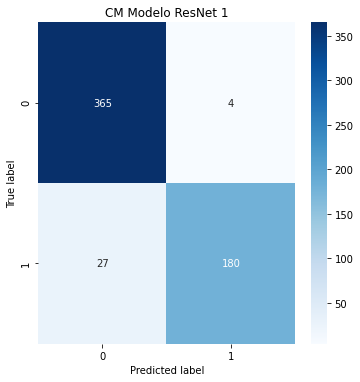

              precision    recall  f1-score   support

           0       0.93      0.99      0.96       369
           1       0.98      0.87      0.92       207

   micro avg       0.95      0.95      0.95       576
   macro avg       0.95      0.93      0.94       576
weighted avg       0.95      0.95      0.95       576



/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:576: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask &= (ar1 != a)


In [131]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import plot_confusion_matrix
import seaborn as sns
import pandas as pd

print('Confusion Matrix:\n')

c_m=confusion_matrix(original, predict)

#print(c_m)
figure = plt.figure(figsize=(5, 5))
sns.heatmap(c_m, annot=True,cmap=plt.cm.Blues,fmt="d")
plt.tight_layout()
plt.title('CM Modelo ResNet 1')
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

print(classification_report(original, predict, labels = [0,1]))


#<span style="color:red"><center>**PREDICCIÓN SEGUNDO MODELO RESNET_2**</center></span>

In [122]:
test_predict2 = modelResnet502.predict(test_generator, steps = test_generator.n // 16, verbose =1)

36/36 [==============================] - 4s 70ms/step


#  Obtener la clase predicha a partir del modelo Resnet50_2


In [132]:
# Obtener el maximo argumento sea cero o uno, esto se consigue con la funcion argmax
predict = []
for i in test_predict2:
  predict.append(str(np.argmax(i)))

predict = np.asarray(predict)

In [133]:
# 576 es el número de predicciones
# 
original = np.asarray(test['mask'])[:576]
len(original)

576

In [134]:
# Porcentaje de aciertos del primer modelo ResNet
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(original, predict)
accuracy

# El modelo con un 94.62% puede determinar si hay o no tumor 

0.9548611111111112

# Matriz de confusión y classification_report del primer modelo ResNet50_2

Confusion Matrix:



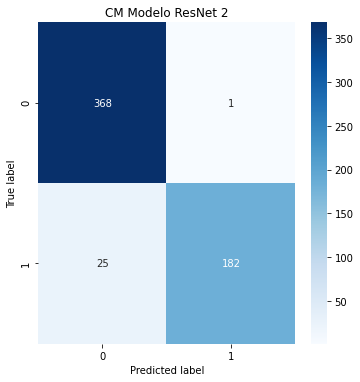

              precision    recall  f1-score   support

           0       0.94      1.00      0.97       369
           1       0.99      0.88      0.93       207

   micro avg       0.95      0.95      0.95       576
   macro avg       0.97      0.94      0.95       576
weighted avg       0.96      0.95      0.95       576



/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:576: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask &= (ar1 != a)


In [136]:
print('Confusion Matrix:\n')

c_m=confusion_matrix(original, predict)

#print(c_m)
figure = plt.figure(figsize=(5, 5))
sns.heatmap(c_m, annot=True,cmap=plt.cm.Blues,fmt="d")
plt.tight_layout()
plt.title('CM Modelo ResNet 2')
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

print(classification_report(original, predict, labels = [0,1]))
                